In [1]:
%run ../modules.ipynb

sys.path.append('../0. kernel-tutorials/')
# Local Utilities for Notebook
from utilities.kernels import linear_kernel, gaussian_kernel
from utilities.general import load_variables, get_stats
from utilities.plotting import (
    plot_base, 
    plot_projection,
    plot_regression,
    plot_simple,
    get_cmaps,
    table_from_dict,
    check_mirrors,
)
cmaps = get_cmaps()
plt.style.use("../0. kernel-tutorials/utilities/kernel_pcovr.mplstyle")
dbl_fig = (2 * plt.rcParams["figure.figsize"][0], plt.rcParams["figure.figsize"][1])

kernel_params = {"kernel": "rbf", "gamma": 1}
kernel_func = partial(rbf_kernel, gamma=1)
kernel_type = "gaussian"
sns.set(style="white", palette="muted", color_codes=True)
my_c=colors.ListedColormap(["mediumblue", 'red'])
c= ["mediumblue", 'red']
sns.set_palette(sns.color_palette(c))

n_FPS=2000
n_frames=30000
n_PC=3

In [2]:
zf = zipfile.ZipFile('./MP_complete.zip') 
df_csv = pd.read_csv(zf.open('MP_complete.csv'))
frames_init_tot=ase.io.read('MP_complete_init.xyz', index=':')
frames_relax_tot=ase.io.read('MP_complete_relax.xyz', index=':')
len(df_csv), len(frames_init_tot), len(frames_relax_tot)

(83989, 83989, 83989)

In [3]:
for frame in frames_relax_tot:
    frame.wrap(eps=1e-10)

In [4]:
natoms_list_tot=[]
for i in range(len(df_csv)):
    natoms_list_tot.append(natoms(df_csv['structure'][i]))
df_csv['natoms']=natoms_list_tot
magic=[]
for i in range(len(df_csv)):
    if natoms_list_tot[i]%4==0:
        m=1
    else:
        m=0
    magic.append(m)
df_csv['magic']=magic             

In [101]:
species = list(set([int(n) for frame in frames_relax_tot for n in frame.numbers]))

hypers = dict(
    soap_type="PowerSpectrum",
    interaction_cutoff=3.5,
    max_radial=4,
    max_angular=4,
    gaussian_sigma_type="Constant",
    gaussian_sigma_constant=0.5,
    cutoff_smooth_width=0.5,
    global_species=species,
    expansion_by_species_method="user defined",
    normalize=False,
)
fps_soap = SOAP(
    **hypers,
)

TypeError: 'dict' object is not callable

In [6]:
idx_for_fps = np.random.randint(0, len(frames_relax_tot), n_FPS) 
frames_for_fps = [frames_relax_tot[i] for i in idx_for_fps]
len(idx_for_fps)


2000

In [7]:
X_temp = np.array(
    [
        np.mean(fps_soap.transform([frame]).get_features(fps_soap), axis=0)
        for frame in frames_for_fps
    ]
)

THRESH = 1e-12
high_var_features = np.where(np.var(X_temp - X_temp.mean(axis=0), axis=0) > THRESH)[0]
X_temp = X_temp[:, high_var_features]

X_raw = StandardFlexibleScaler(column_wise=False).fit_transform(X_temp)
del X_temp # save on memory

In [8]:
fps = FPS(n_FPS).fit(X_raw)
del X_raw 
u_species = np.unique(species)
sp_pairs = fps_soap.get_keys(u_species)

coefficient_subselection = np.zeros((n_FPS, 5))
index_mapping = get_power_spectrum_index_mapping(
    sp_pairs, n_max=hypers["max_radial"], l_max=hypers["max_angular"] + 1
)
for fi, i in enumerate(high_var_features[fps.selected_idx_]):
    coefficient_subselection[fi] = [
        index_mapping[i][k] for k in ["a", "b", "n1", "n2", "l"]
    ]
coefficient_subselection_dict = {
    "a": coefficient_subselection[:, 0].tolist(),
    "b": coefficient_subselection[:, 1].tolist(),
    "n1": coefficient_subselection[:, 2].tolist(),
    "n2": coefficient_subselection[:, 3].tolist(),
    "l": coefficient_subselection[:, 4].tolist(),
}

soap = SOAP(**hypers, coefficient_subselection=coefficient_subselection_dict)


In [10]:
idx = np.random.randint(0, len(frames_relax_tot), n_frames) 
my_frames= [frames_relax_tot[i] for i in idx]
e_form=np.array(df_csv['e_form']).reshape(-1, 1)[idx]
e_hull=np.array(df_csv["e_hull"]).reshape(-1, 1)[idx]
gap_e=np.array(df_csv["gap pbe"]).reshape(-1, 1)[idx]
natoms=np.array(df_csv["natoms"]).reshape(-1, 1)[idx]
magic=np.array(df_csv["magic"]).reshape(-1, 1)[idx]


In [143]:
len(idx)

30000

In [11]:
X_raw = np.zeros((len(my_frames), n_FPS))
for fi, frame in enumerate(my_frames):
    X_raw[fi] = np.mean(soap.transform([frame]).get_features(soap), axis=0)

In [14]:
fcc=np.zeros(len(my_frames))
packing=np.zeros(len(my_frames))
n_species=np.zeros(len(my_frames))
cn=np.zeros(len(my_frames))
alpha=np.zeros(len(my_frames))
x=np.zeros(len(my_frames))
std_ratio=np.zeros(len(my_frames))

for i, k in zip(my_frames, range(len(my_frames))):
    sg=ase.spacegroup.get_spacegroup(i, symprec=1e-05)
    if 220<sg.no<231:
        fcc[k]=int(1)
    frame_py=get_pymatgen(i)
    v=i.get_volume()  #unit = A^^3
    el=i.get_chemical_symbols()
    n_species[k]=(len(np.unique(el)))
    rad=get_r(el)
    v_atom=sum([(4/3)*pi*(rad[i]/100)**3 for i in range(len(rad))])
    nn=np.zeros(len(el))
    for l in range(len(el)):   
        try:
            nn[l]=CrystalNN(weighted_cn=False, distance_cutoffs=None, x_diff_weight=0.0,
                    porous_adjustment=False).get_cn(frame_py, l)
        except:
            pass
    cn[k]=nn.mean()
    rad=np.array(rad)
    n_s=np.count_nonzero(rad == np.min(rad))
    n_l=np.count_nonzero(rad == np.max(rad))
    alpha[k]=np.min(rad)/np.max(rad)
    x[k]=n_s/(n_s+n_l)
    std_ratio[k]=np.std(rad)
    packing[k]=v_atom/v

In [3]:
y_raw=np.copy(e_form)
X_raw=np.copy(X_raw)
(y_raw.reshape(-1, 1).shape), (X_raw.shape), e_form.shape

((30000, 1), (30000, 2000), (30000, 1))

In [4]:
i_train, i_test, X_train, X_test, y_train, y_test = train_test_split(
    np.arange(X_raw.shape[0]), X_raw, y_raw, train_size=0.8
)
x_scaler = StandardFlexibleScaler(column_wise=False).fit(X_raw)
y_scaler = StandardFlexibleScaler(column_wise=False).fit(y_raw)

X = x_scaler.transform(X_raw)
Y = y_scaler.transform(y_raw)

X_train = x_scaler.transform(X_train)
y_train = y_scaler.transform(y_train)

X_test = x_scaler.transform(X_test)
y_test = y_scaler.transform(y_test)

X_train.shape, X_test.shape, y_train.shape, y_test.shape


((24000, 2000), (6000, 2000), (24000, 1), (6000, 1))

R^2 of training is  0.89690474978
R^2 of testing is  0.881202969276
Best regularization is  1e-06
RMSE on predicted quantity =  0.00598204939712


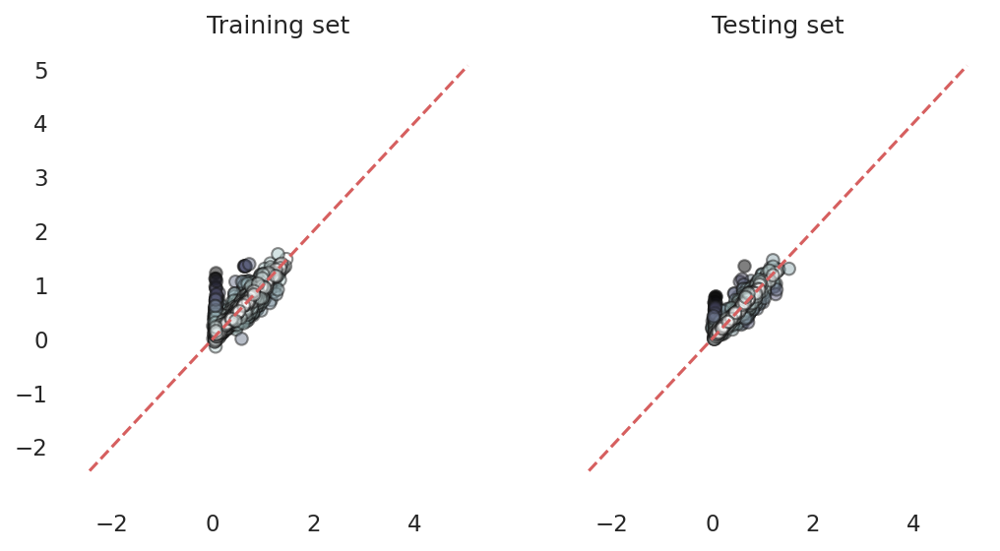

In [86]:
alphas=np.logspace(-0, -6, 30)
ridgecv = RidgeCV(cv=4,fit_intercept=False, alphas=alphas)
ridgecv.fit(X_train, y_train)
yp_test=ridgecv.predict(X_test)
yp_train=ridgecv.predict(X_train)
print('R^2 of training is ', ridgecv.score(X_train,y_train))
print('R^2 of testing is ', ridgecv.score(X_test,y_test))
print('Best regularization is ', ridgecv.alpha_)
fig, (ax_train, ax_test)=plt.subplots(1,2,figsize=(8,4), sharex=True, sharey=True)
ax_train.scatter(y_train, yp_train, c=np.abs(y_train - yp_train), alpha=0.5, cmap="bone_r", ec="k")
ax_test.scatter(y_test, yp_test, c=np.abs(y_test - yp_test), alpha=0.5, cmap="bone_r", ec="k")
bounds=(np.min((Y.min(), yp_train.min(), yp_test.min())), 
       np.max((Y.max(), yp_train.max(), yp_test.max()))
       )
ax_train.plot(bounds,bounds, 'r--')
ax_train.set_title('Training set')
ax_test.set_title('Testing set')
ax_test.plot(bounds,bounds, 'r--')
sns.despine(left=True, bottom=True)
print("RMSE on predicted quantity = ", mean_squared_error(y_test, yp_test))


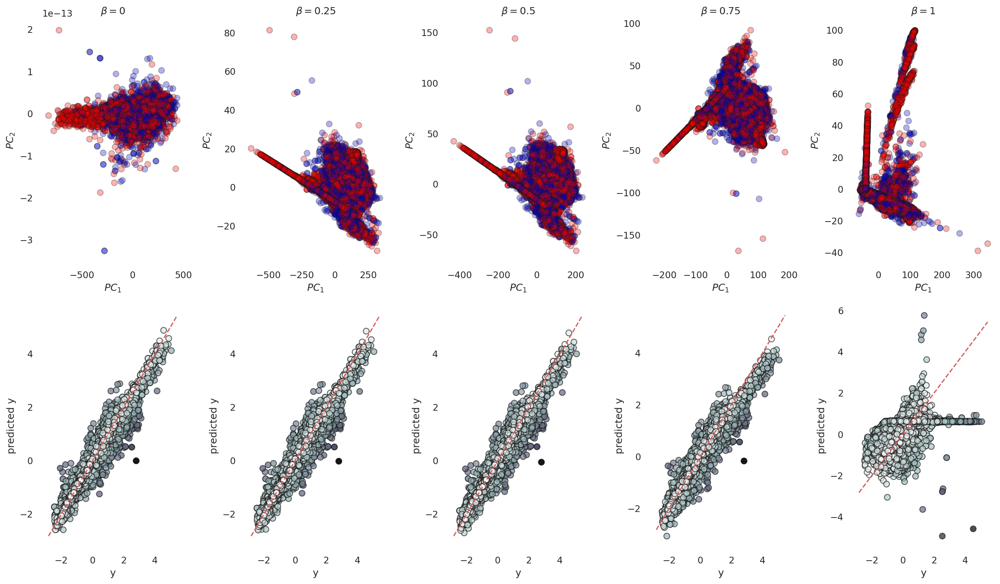

In [11]:
betas=[0,0.25, 0.5, 0.75, 1]
alphas=np.logspace(-0, -6, 30)
ridgecv = RidgeCV(cv=4,fit_intercept=False, alphas=alphas)
fig, axes = plt.subplots(2,5, figsize=(17,10))

for i in range(len(betas)):
    pcovr = PCovR(mixing=betas[i],
              n_components=n_PC)
    pcovr.fit(X,Y)
    T = pcovr.transform(X)
    yp = pcovr.predict(X)

    axes[0,i].scatter(T[:, 0], T[:, 1], s=50, alpha=0.3, c=magic, cmap = my_c, edgecolor="k")
    axes[0,i].set_xlabel(r"$PC_1$")
    axes[0,i].set_ylabel(r"$PC_2$")

    axes[1,i].scatter(Y, yp, s=50, alpha=0.7, c=np.abs(Y - yp), cmap='bone_r', edgecolor="k")
    axes[1,i].plot(axes[1,i].get_xlim(), axes[1,i].get_xlim(), 'r--')
    axes[1,i].set_xlabel(r"y")
    axes[1,i].set_ylabel(r"predicted y")

    axes[0,i].set_title(r"$\beta=$" + str(betas[i]))
    fig.tight_layout()
    sns.despine(left=True, bottom=True)

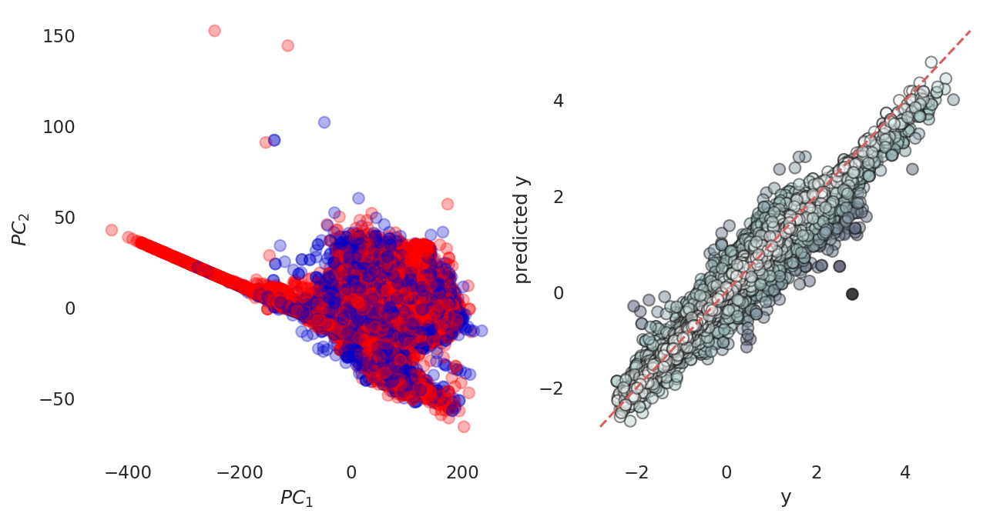

In [12]:
pcovr = PCovR(mixing=0.5,
              n_components=n_PC)
pcovr.fit(X,Y)
T = pcovr.transform(X)
yp = pcovr.predict(X)
fig, (ax1, ax2)= plt.subplots(1,2, figsize=(10,5))

ax1.scatter(T[:, 0], T[:, 1], s=50, alpha=0.3, c=magic, cmap = my_c)
ax1.set_xlabel(r"$PC_1$")
ax1.set_ylabel(r"$PC_2$")

ax2.scatter(Y, yp, s=50, alpha=0.5, c=np.abs(Y - yp), cmap='bone_r', edgecolor="k")
ax2.plot(ax2.get_xlim(), ax2.get_xlim(), 'r--')
ax2.set_xlabel(r"y")
ax2.set_ylabel(r"predicted y")
sns.despine(left=True, bottom=True)

w_i_l=pcovr.pxt_
w_l_i=pcovr.pty_
w_i_p=pcovr.pxy_
var=pcovr.explained_variance_ 
sing=pcovr.singular_values_
# pxt_ : ndarray of size :math:`({n_{samples}, n_{components}})`
#            the projector, or weights, from the input space :math:`\mathbf{X}`
#            to the latent-space projection :math:`\mathbf{T}`
# pty_ : ndarray of size :math:`({n_{components}, n_{properties}})`
#       the projector, or weights, from the latent-space projection
#       :math:`\mathbf{T}` to the properties :math:`\mathbf{Y}`
# pxy_ : ndarray of size :math:`({n_{samples}, n_{properties}})`
#        the projector, or weights, from the input space :math:`\mathbf{X}`
#        to the properties :math:`\mathbf{Y}`
# explained_variance_ : ndarray of shape (n_components,)
#     The amount of variance explained by each of the selected components.
#     Equal to n_components largest eigenvalues
#     of the PCovR-modified covariance matrix of :math:`\mathbf{X}`.
# singular_values_ : ndarray of shape (n_components,)
#     The singular values corresponding to each of the selected components.

In [24]:
w_i_p, var, sing ,X_train.shape, y_train.shape, y_test.shape

(array([[-1.03215383],
        [-2.24657489],
        [-0.43275869],
        ...,
        [ 1.51791671],
        [-0.11108724],
        [-0.74769258]]),
 array([9054.82348997,  194.99195464,   66.53634497]),
 array([16481.37281526,  2418.58711796,  1412.80706851]),
 (24000, 2000),
 (24000, 1),
 (6000, 1))

In [21]:
# fig, axes = plt.subplots(2,5, figsize=(17,10))
# for i in range(len(betas)):
#     kpcovr = KPCovR(
#     mixing=betas[i],
#     alpha=ridgecv.alpha_,
#     kernel="rbf",
#     gamma=0.1,
#     n_components=n_PC)
#     kpcovr.fit(X, Y)
#     Tk = kpcovr.transform(X)
#     ypk = y_scaler.inverse_transform(kpcovr.predict(X))

#     axes[0,i].scatter(Tk[:, 0], Tk[:, 1], s=50, alpha=0.3, c=magic, cmap = my_c, edgecolor="k")
#     axes[0,i].set_xlabel(r"$PC_1$")
#     axes[0,i].set_ylabel(r"$PC_2$")

#     axes[1,i].scatter(Y, ypk, s=50, alpha=0.7, c=np.abs(Y - yp), cmap='bone_r', edgecolor="k")
#     axes[1,i].plot(axes[1,i].get_xlim(), axes[1,i].get_xlim(), 'r--')
#     axes[1,i].set_xlabel(r"y")
#     axes[1,i].set_ylabel(r"predicted y")

#     axes[0,i].set_title(r"$\beta=$" + str(betas[i]))
#     fig.tight_layout()
#     sns.despine(left=True, bottom=True)

In [170]:
# file=np.savez('../datasets/MP_PCA_soap'+str(n_frames)+'.npz', idx=idx, my_frames=my_frames,
#               e_form=e_form, cn=cn,n_species=n_species,
# e_hull=e_hull, gap_e=gap_e, natoms=natoms, magic=magic, fcc=fcc, 
# packing=packing,alpha=alpha, x=x, std_ratio=std_ratio, X_raw=X_raw,
#          T=T, yp=yp)


In [2]:
npzfile = np.load('../datasets/MP_PCA_soap'+str(n_frames)+'.npz', allow_pickle=True)
idx=npzfile['idx']
my_frames=npzfile['my_frames']
e_hull=npzfile['e_hull']
e_form=npzfile['e_form']
gap_e=npzfile['gap_e']

natoms=npzfile['natoms']
magic=npzfile['magic']

std_ratio=npzfile['std_ratio']
n_species=npzfile['n_species']
alpha=npzfile['alpha']
x=npzfile['x']
cn=npzfile['cn']
packing=npzfile['packing']
fcc=npzfile['fcc']

X_raw=npzfile['X_raw']
T=npzfile['T']
yp=npzfile['yp']
# Tk=npzfile['Tk']
# ypk=npzfile['ypk']

In [ ]:
hcp=np.zeros(len(my_frames))
hcp_red=np.zeros(len(my_frames))
sg=np.zeros(len(my_frames))
sg_red=np.zeros(len(my_frames))
for i,k in zip(my_frames, range(len(my_frames))):
    
    sg1=ase.spacegroup.get_spacegroup(i, symprec=1e-05)
    sg[k]=sg1
    el=i.get_chemical_symbols()
    n_species[k]=(len(np.unique(el)))
    rad=get_r(el)
    indexes = [i for i,x in enumerate(rad) if x == max(i for i in rad if i is not None)]
    max_el=np.array(i.get_chemical_symbols())[indexes]
    max_pos=np.array(i.get_positions())[indexes]
    new=Atoms(max_el, positions=max_pos, pbc=True, cell=i.get_cell())
    sg_red1=(ase.spacegroup.get_spacegroup(new, symprec=1e-05))
    sg_red[k]=sg_red1

    if 190<sg_red1.no<195:
        hcp_red[k]=int(1)
    if 190<sg1.no<195:
        hcp[k]=int(1)
explore={r'HCP$_{tot}$':hcp,r'HCP$_{red}$':hcp_red,
       'magic':magic.ravel()} 
df= pd.DataFrame(explore)
print(str(len(df.loc[((df['magic']==1) & (df[r'HCP$_{red}$']==1))])/len(df.loc[((df[r'HCP$_{red}$']==1))])))

In [159]:
hcp.shape

(30000,)

In [ ]:
titles=['Formation energy per atom (eV)', 'Energy above convex hull (eV)', 'Band gab energy (eV)']
quantity=[e_form, e_hull, gap_e]
for i in range(len(titles)):
    X=np.copy(X_raw)
    y_raw=quantity[i].reshape(-1,1)
    i_train, i_test, X_train, X_test, y_train, y_test = train_test_split(
    np.arange(X.shape[0]), X, y_raw, train_size=0.8
    )

    x_scaler = StandardFlexibleScaler(column_wise=False).fit(X)
    y_scaler = StandardFlexibleScaler(column_wise=True).fit(y_raw)

    # Center total dataset
    X = x_scaler.transform(X)
    Y = y_scaler.transform(y_raw)

    # Center training data
    X_train = x_scaler.transform(X_train)
    y_train = y_scaler.transform(y_train)

    # Center training data
    X_test = x_scaler.transform(X_test)
    y_test = y_scaler.transform(y_test)
    pcovr = PCovR(mixing=0.3,
              n_components=n_PC)
    pcovr.fit(X,Y)
    
    T = pcovr.transform(X)
    yp = pcovr.predict(X)
    
    ridgecv.fit(X_train, y_train)
    yp_test=ridgecv.predict(X_test)
#     fig, ((caxT, caxM),(axT, axM),  (axy, axy_reg), (caxy, caxy_reg)) = plt.subplots(
#         4, 2, figsize=(9,9), gridspec_kw=dict(height_ratios=(0.07, 1, 1, 0.07)))
    fig, ((axT, axM),  (axy, axy_reg)) = plt.subplots(
        2, 2, figsize=(9,7))
    cax = fig.add_axes()
    
    scatT = axT.scatter(T[:, 0], T[:, 1], alpha=0.4, c=Y, cmap='viridis')
    axT.set_xlabel(r"$PCov_1$")
    axT.set_ylabel(r"$PCov_2$")
    fig.colorbar(scatT, cax=cax, orientation='vertical', label=titles[i])

#     fig.colorbar(scatT, cax=caxT, label=titles[i], orientation="horizontal")

    scatM = axM.scatter(T[:, 0], T[:, 1], alpha=0.4, c=magic, cmap = my_c)
    axM.set_xlabel(r"$PCov_1$")
#     fig.colorbar(scatM, cax=caxM, label="magic=1", orientation="horizontal")

    scaty = axy.scatter(Y, yp, alpha=0.5, c=np.abs(Y - yp), cmap='bone_r')
    axy.plot(axy.get_xlim(), axy.get_xlim(), 'r--')
    axy.set_xlabel(r"True value")
    axy.set_ylabel(r"Predicted value (PCovR)")
#     fig.colorbar(scaty, cax=caxy,label='Error in y', orientation="horizontal")
    
    scaty_reg=axy_reg.scatter(y_test, yp_test, c=np.abs(y_test - yp_test), cmap="bone_r", alpha=0.5)    
    axy_reg.plot(axy.get_xlim(), axy.get_xlim(), 'r--')
    axy_reg.set_xlabel(r"True value")
    axy_reg.set_ylabel(r"Predicted value (LR)")
#     fig.colorbar(scaty_reg, cax=caxy_reg,label='Error in y', orientation="horizontal")
    sns.despine(left=True, bottom=True)
    fig.tight_layout()

    print('R^2 with PCovR= ', pcovr.score(X,Y))
    print('R^2 of testing is with RidgeCV', ridgecv.score(X_test,y_test))
    print("RMSE on predicted quantity = ", mean_squared_error(y_test, yp_test))
    print("error in units (eV) of predicted quantity before scaling = ", (max(y_raw)-min(y_raw))*(1-ridgecv.score(X_test,y_test)))
    print("error in units (eV) of predicted quantity after scaling= ", (max(Y)-min(Y))*(1-ridgecv.score(X_test,y_test)))

    plt.show()
    plt.close()

In [ ]:
Y_tot=np.vstack((alpha, cn, packing, x)).T
X=np.copy(X_raw)
y_raw=np.copy(Y_tot)
i_train, i_test, X_train, X_test, y_train, y_test = train_test_split(
np.arange(X.shape[0]), X, y_raw, train_size=0.8)

x_scaler = StandardFlexibleScaler(column_wise=False).fit(X)
y_scaler = StandardFlexibleScaler(column_wise=False).fit(y_raw)

# Center total dataset
X = x_scaler.transform(X)
Y = y_scaler.transform(y_raw)

# Center training data
X_train = x_scaler.transform(X_train)
y_train = y_scaler.transform(y_train)

# Center training data
X_test = x_scaler.transform(X_test)
y_test = y_scaler.transform(y_test)
mix=[0.5]
for g in range(len(mix)):

    pcovr.fit(X,Y)

    T = pcovr.transform(X)
    yp = pcovr.predict(X)


    ridgecv.fit(X_train, y_train)
    yp_test=ridgecv.predict(X_test)
#     fig, ((caxT, caxM),(axT, axM),  (axy, axy_reg), (caxy, caxy_reg)) = plt.subplots(
#         4, 2, figsize=(9,9), gridspec_kw=dict(height_ratios=(0.07, 1, 1, 0.07)))
    fig, ((axT, axM),  (axy, axy_reg)) = plt.subplots(
        2, 2, figsize=(9,7))
    cax = fig.add_axes(axes=axM)

    scatT = axT.scatter(T[:, 0], T[:, 1], alpha=0.4, c=magic, cmap='plasma')
    axT.set_xlabel(r"$PCov_1$")
    axT.set_ylabel(r"$PCov_2$")
    fig.colorbar(scatT, cax=cax, orientation='vertical', 
                 label=str('Geometric features')+r', $\beta$='+str(mix[g]) )

#     fig.colorbar(scatT, cax=caxT, label=titles[i], orientation="horizontal")

    scatM = axM.scatter(T[:, 0], T[:, 1], alpha=0.4, c=magic, cmap = my_c)
    axM.set_xlabel(r"$PCov_1$")
#     fig.colorbar(scatM, cax=caxM, label="magic=1", orientation="horizontal")

    scaty = axy.scatter(Y, yp, alpha=0.5, c=np.abs(Y - yp), cmap='bone_r')
    axy.plot(axy.get_xlim(), axy.get_xlim(), 'r--')
    axy.set_xlabel(r"True value")
    axy.set_ylabel(r"Predicted value (PCovR)")
#     fig.colorbar(scaty, cax=caxy,label='Error in y', orientation="horizontal")

    scaty_reg=axy_reg.scatter(y_test, yp_test, c=np.abs(y_test - yp_test), cmap="bone_r", alpha=0.5)    
    axy_reg.plot(axy.get_xlim(), axy.get_xlim(), 'r--')
    axy_reg.set_xlabel(r"True value")
    axy_reg.set_ylabel(r"Predicted value (LR)")
#     fig.colorbar(scaty_reg, cax=caxy_reg,label='Error in y', orientation="horizontal")
    sns.despine(left=True, bottom=True)
    fig.tight_layout()

#     print('R^2 with PCovR= ', pcovr.score(X,Y))
#     print('R^2 of testing is with RidgeCV', ridgecv.score(X_test,y_test))
#     print("RMSE on predicted quantity = ", mean_squared_error(y_test, yp_test))
#     print("error in units (eV) of predicted quantity before scaling = ", (max(y_raw)-min(y_raw))*(1-ridgecv.score(X_test,y_test)))
#     print("error in units (eV) of predicted quantity after scaling= ", (max(Y)-min(Y))*(1-ridgecv.score(X_test,y_test)))

    plt.show()
    plt.close()

    data = write_input(
    path='../chem/MP'+str(n_frames)+'_beta='+str(mix[g])+'_TOT.json.gz',
    meta={"name": 'MP'+str(n_frames)+'pcovr_TOT'},
    frames=my_frames,
    properties={
        **{f"PCA_{i+1}": 
            {"target": "structure", 
            "values": T[:, i]} for i in range(n_PC)},
        "magic": {
            "target": "structure",
            "values": magic,
        }, 

         "packing": {
            "target": "structure",
            "values": packing, 
         },
        "alpha": {
            "target": "structure",
            "values": alpha, 
         },
        "x": {
            "target": "structure",
            "values": x, 
         },
        "std_rad": {
            "target": "structure",
            "values": std_ratio, 
         },
        "FCC": {
            "target": "structure",
            "values": fcc, 
         },
        "natoms": {
            "target": "structure",
            "values": natoms, 
         },
         
         "n_species": {
            "target": "structure",
            "values": n_species, 
         },
    })

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  1.02816856229e+50
R^2 of testing is with RidgeCV 0.908229636169
RMSE on predicted quantity =  0.091842218594
error in units (eV) of predicted quantity before scaling =  [ 0.08294629]
error in units (eV) of predicted quantity after scaling=  [ 0.37315842]


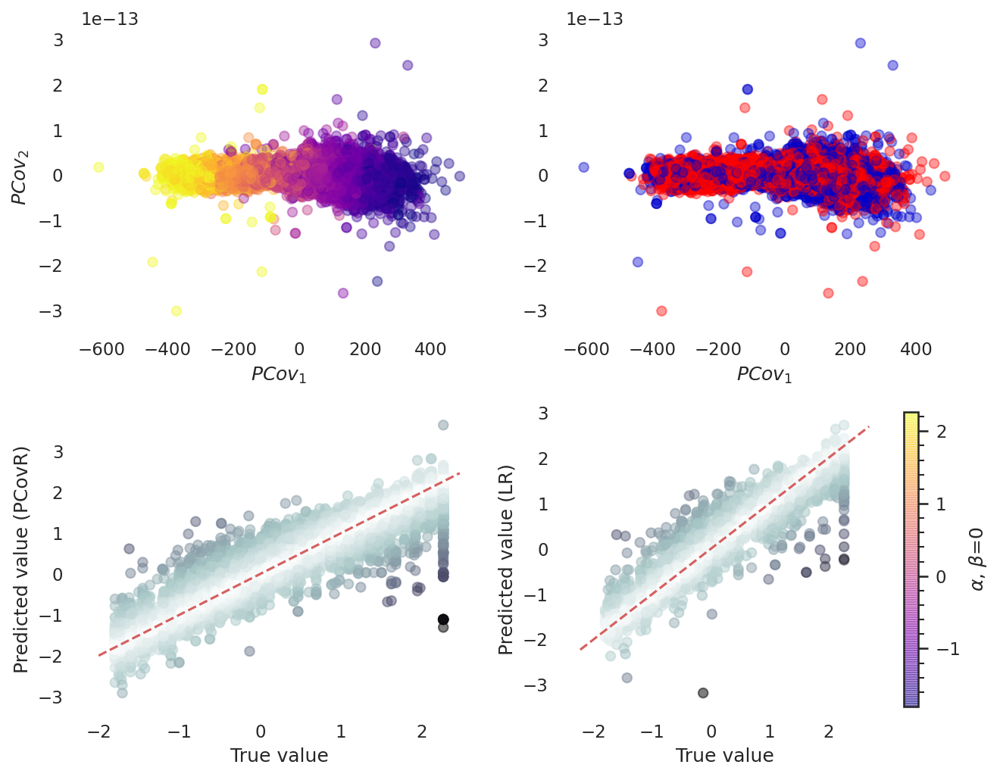

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  1.51813880927e+50
R^2 of testing is with RidgeCV 0.908229636169
RMSE on predicted quantity =  0.091842218594
error in units (eV) of predicted quantity before scaling =  [ 0.08294629]
error in units (eV) of predicted quantity after scaling=  [ 0.37315842]


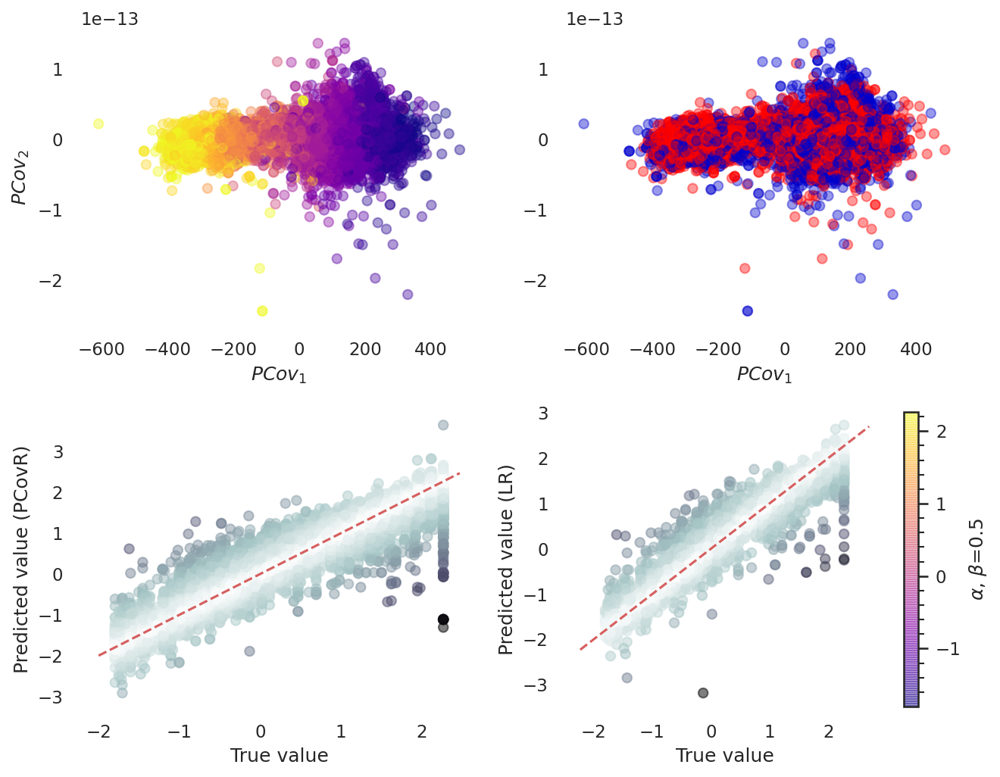

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  4.00167161518e+49
R^2 of testing is with RidgeCV 0.908229636169
RMSE on predicted quantity =  0.091842218594
error in units (eV) of predicted quantity before scaling =  [ 0.08294629]
error in units (eV) of predicted quantity after scaling=  [ 0.37315842]


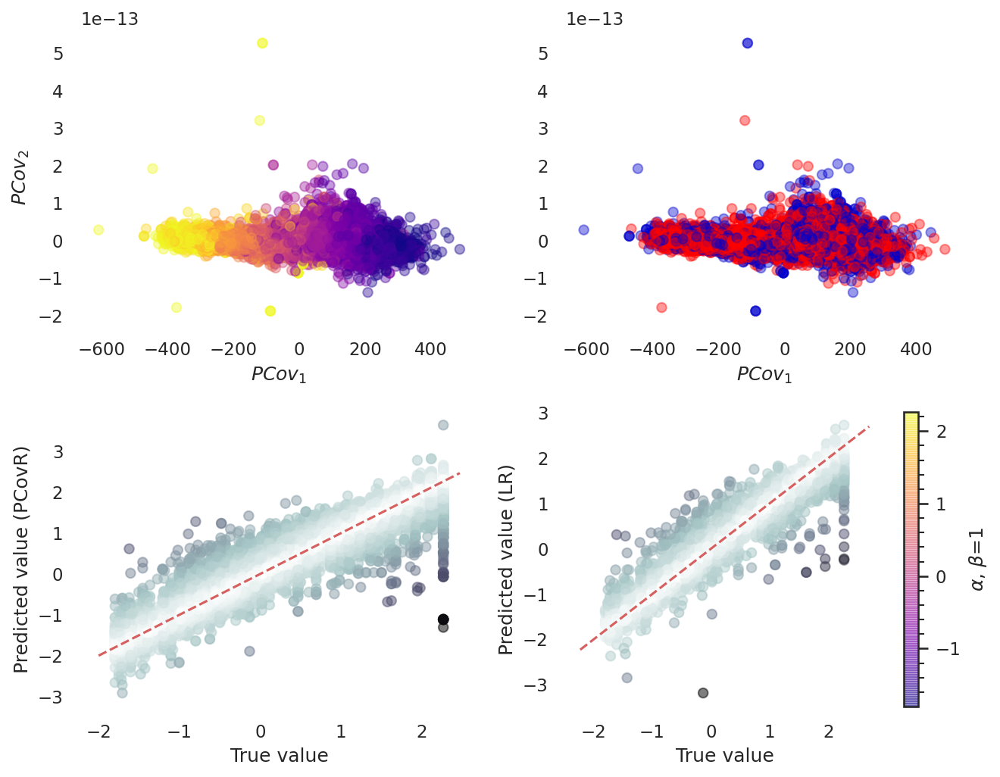

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  3.68721407545e+50
R^2 of testing is with RidgeCV 0.631610405723
RMSE on predicted quantity =  0.368868690649
error in units (eV) of predicted quantity before scaling =  [ 0.34659818]
error in units (eV) of predicted quantity after scaling=  [ 1.81202631]


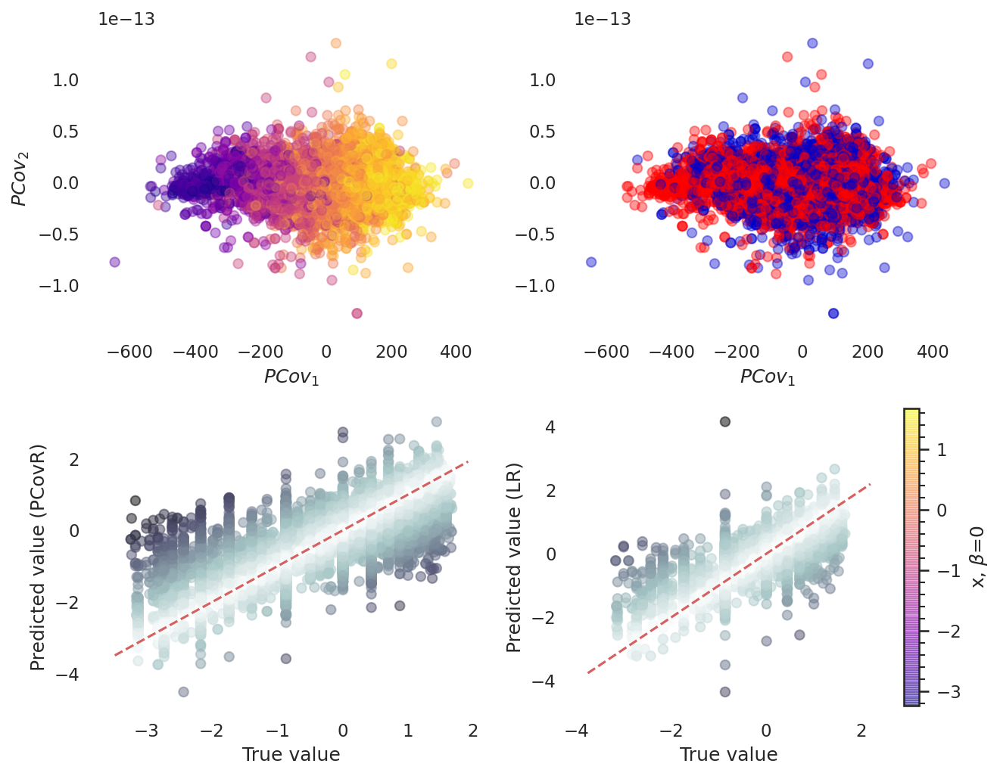

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  2.98019643567e+50
R^2 of testing is with RidgeCV 0.631610405723
RMSE on predicted quantity =  0.368868690649
error in units (eV) of predicted quantity before scaling =  [ 0.34659818]
error in units (eV) of predicted quantity after scaling=  [ 1.81202631]


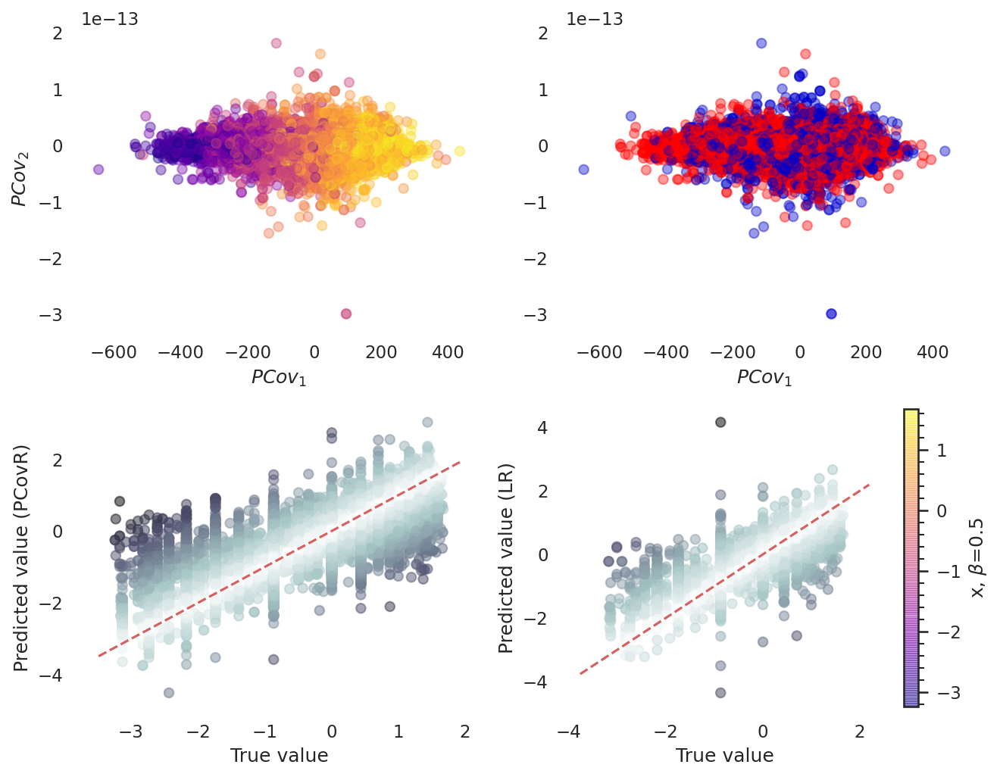

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  4.21333370111e+49
R^2 of testing is with RidgeCV 0.631610405723
RMSE on predicted quantity =  0.368868690649
error in units (eV) of predicted quantity before scaling =  [ 0.34659818]
error in units (eV) of predicted quantity after scaling=  [ 1.81202631]


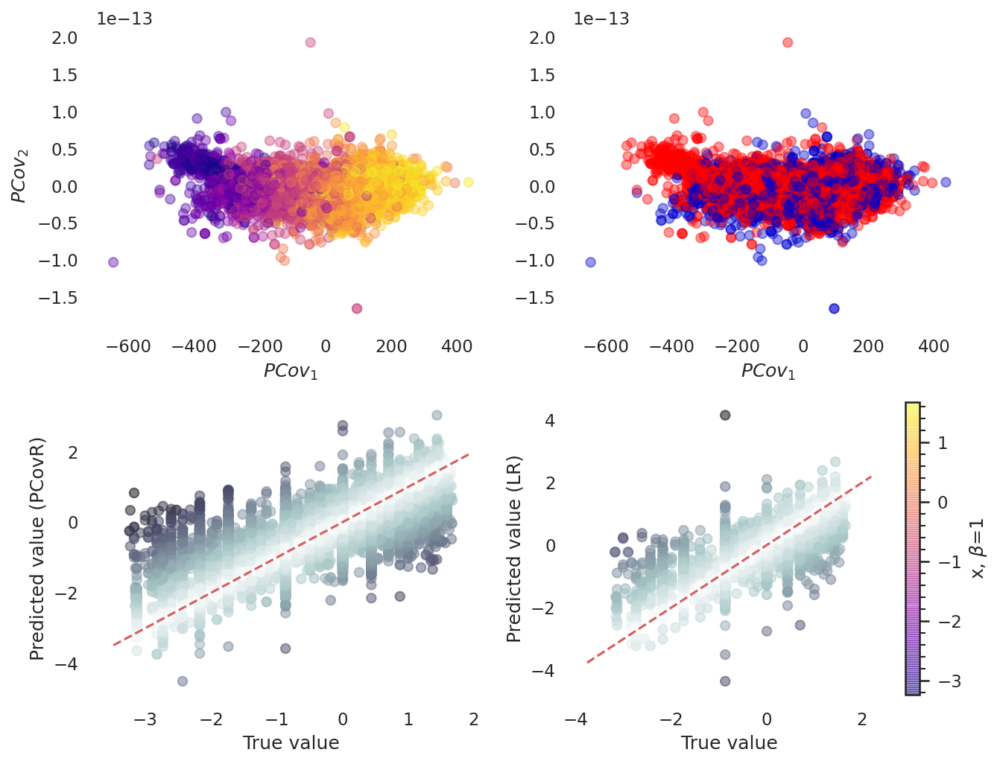

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  7.01745849914e+49
R^2 of testing is with RidgeCV 0.90048271064
RMSE on predicted quantity =  0.10125899222
error in units (eV) of predicted quantity before scaling =  [ 0.15171525]
error in units (eV) of predicted quantity after scaling=  [ 0.67836732]


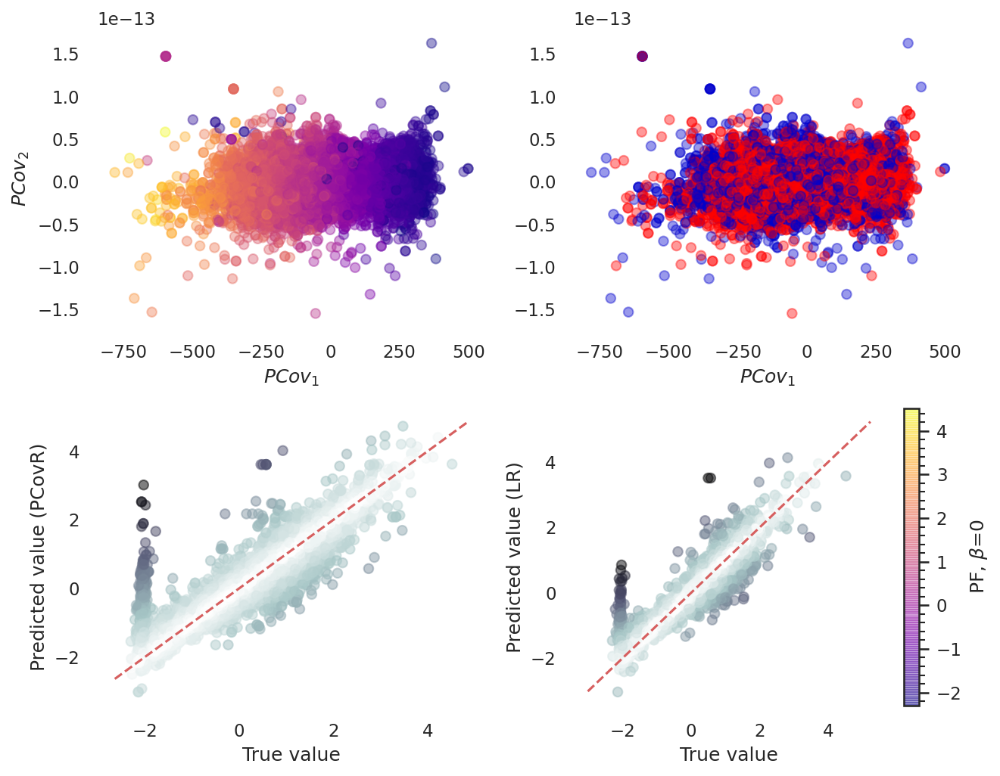

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  1.92092113702e+50
R^2 of testing is with RidgeCV 0.90048271064
RMSE on predicted quantity =  0.10125899222
error in units (eV) of predicted quantity before scaling =  [ 0.15171525]
error in units (eV) of predicted quantity after scaling=  [ 0.67836732]


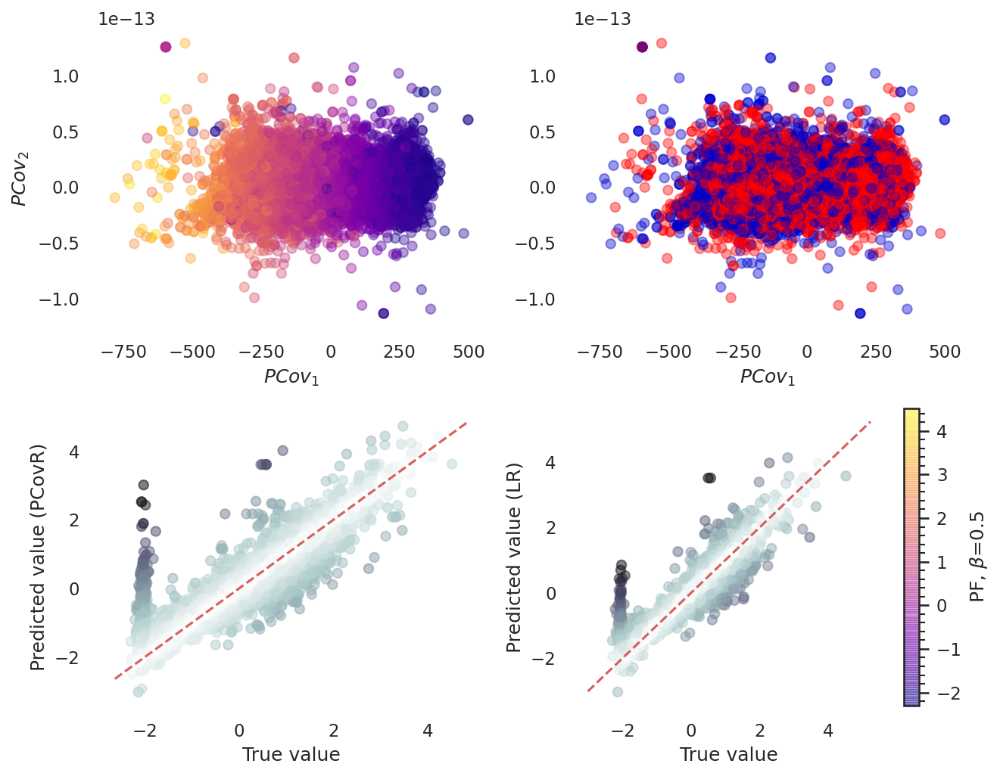

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  1.3707870503e+49
R^2 of testing is with RidgeCV 0.90048271064
RMSE on predicted quantity =  0.10125899222
error in units (eV) of predicted quantity before scaling =  [ 0.15171525]
error in units (eV) of predicted quantity after scaling=  [ 0.67836732]


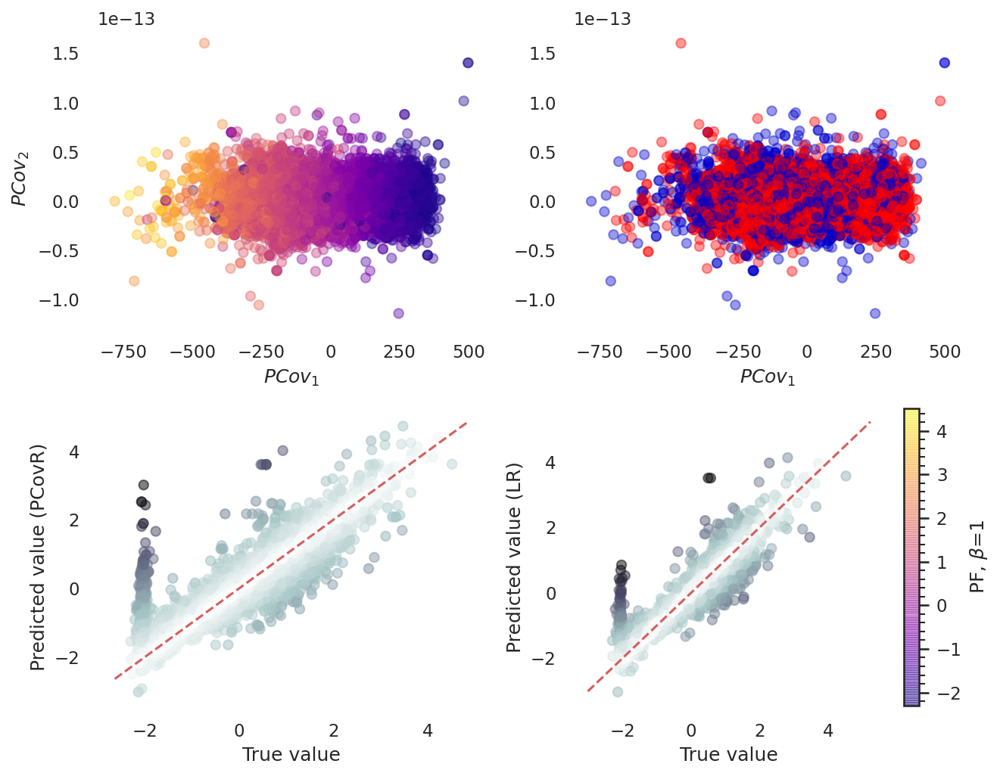

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  5.21936294542e+50
R^2 of testing is with RidgeCV 0.803104456522
RMSE on predicted quantity =  0.194380670544
error in units (eV) of predicted quantity before scaling =  [ 2.55964207]
error in units (eV) of predicted quantity after scaling=  [ 0.84876332]


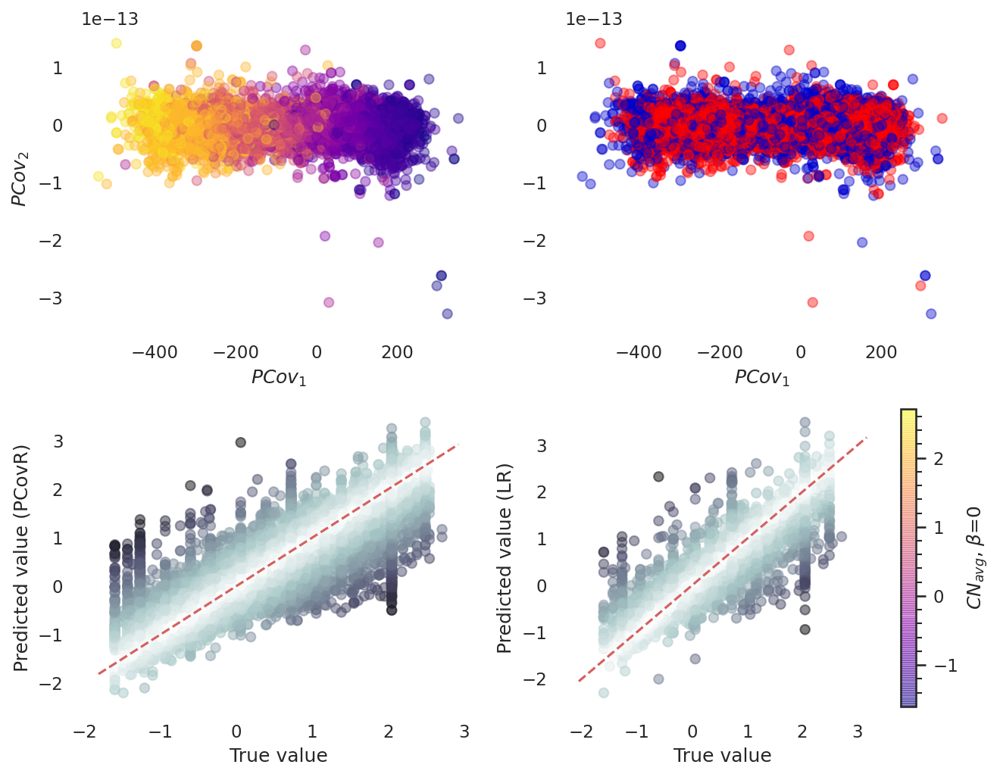

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  3.73090152784e+50
R^2 of testing is with RidgeCV 0.803104456522
RMSE on predicted quantity =  0.194380670544
error in units (eV) of predicted quantity before scaling =  [ 2.55964207]
error in units (eV) of predicted quantity after scaling=  [ 0.84876332]


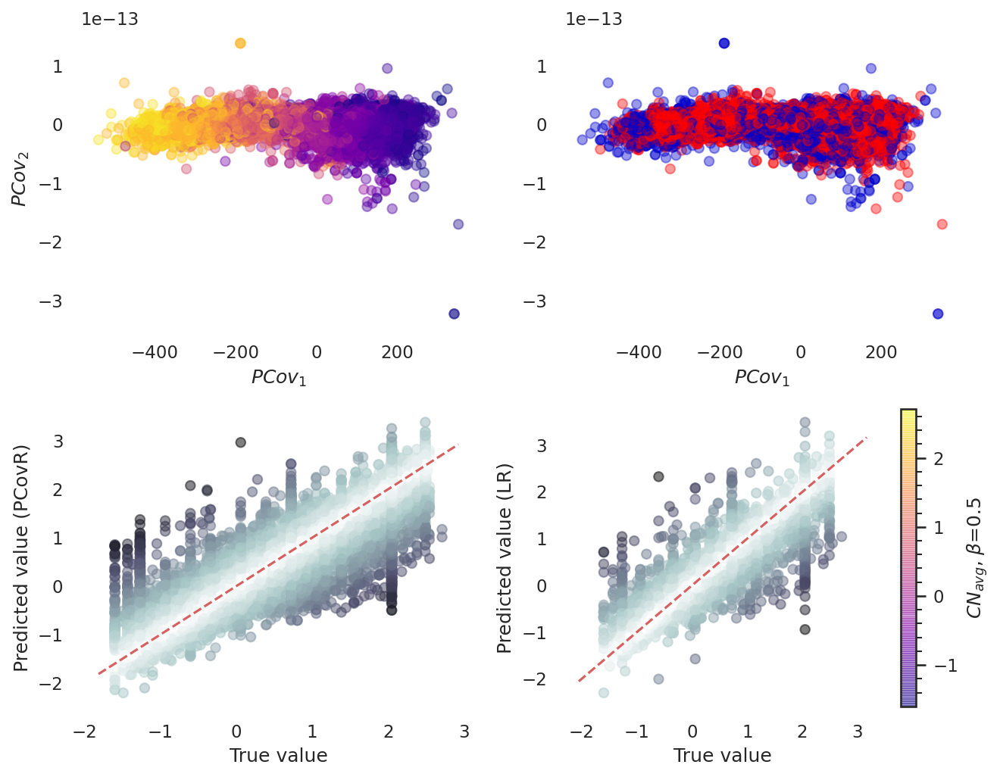

<ipython-input-118-0e8a172c63b5>:43: MatplotlibDeprecationWarning: Calling add_axes() without argument is deprecated since 3.3 and will be removed two minor releases later. You may want to use add_subplot() instead.
  cax = fig.add_axes()


R^2 with PCovR=  3.43104159289e+49
R^2 of testing is with RidgeCV 0.803104456522
RMSE on predicted quantity =  0.194380670544
error in units (eV) of predicted quantity before scaling =  [ 2.55964207]
error in units (eV) of predicted quantity after scaling=  [ 0.84876332]


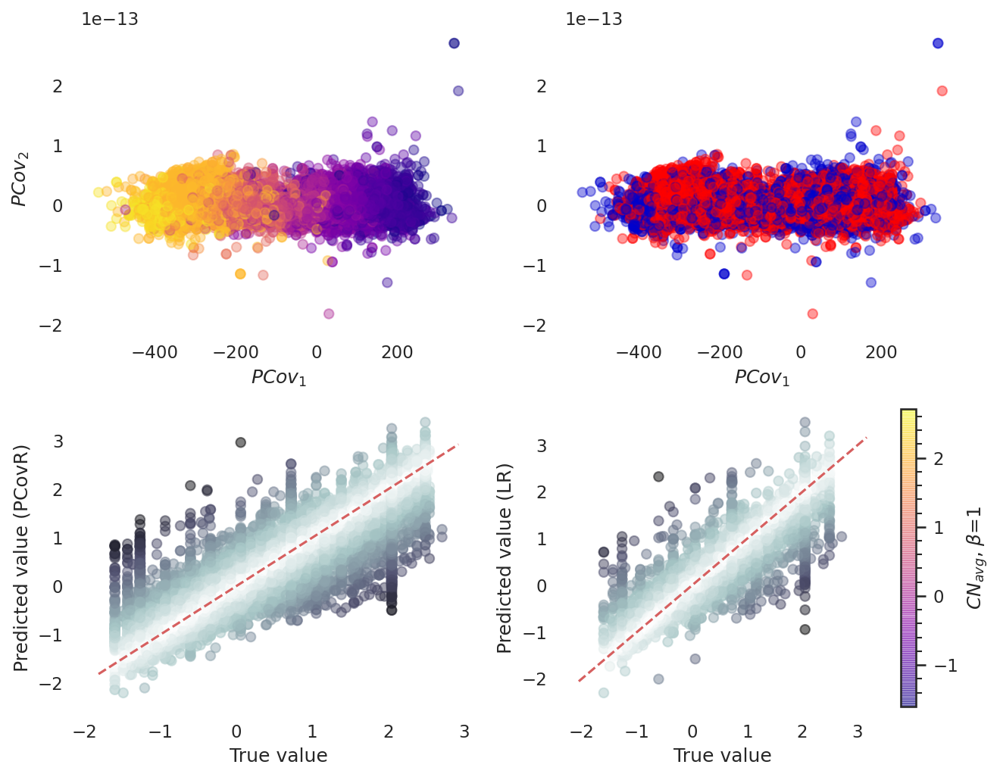

In [118]:
titles=[r'$\alpha$', 'x', 'PF', r'$CN_{avg}$']
quantity=[alpha, x, packing, cn]
alphas=np.logspace(-0, -6, 30)
ridgecv = RidgeCV(cv=4,fit_intercept=False, alphas=alphas)
pcovr = PCovR(mixing=mix[g],
                  n_components=n_PC)
for i in range(len(titles)):
    X=np.copy(X_raw)
    y_raw=quantity[i].reshape(-1,1)
    i_train, i_test, X_train, X_test, y_train, y_test = train_test_split(
    np.arange(X.shape[0]), X, y_raw, train_size=0.8
    )

    x_scaler = StandardFlexibleScaler(column_wise=False).fit(X)
    y_scaler = StandardFlexibleScaler(column_wise=True).fit(y_raw)

    # Center total dataset
    X = x_scaler.transform(X)
    Y = y_scaler.transform(y_raw)

    # Center training data
    X_train = x_scaler.transform(X_train)
    y_train = y_scaler.transform(y_train)

    # Center training data
    X_test = x_scaler.transform(X_test)
    y_test = y_scaler.transform(y_test)
    mix=[0, 0.5, 1]
    for g in range(len(mix)):
        
        pcovr.fit(X,Y)

        T = pcovr.transform(X)
        yp = pcovr.predict(X)
        

        ridgecv.fit(X_train, y_train)
        yp_test=ridgecv.predict(X_test)
    #     fig, ((caxT, caxM),(axT, axM),  (axy, axy_reg), (caxy, caxy_reg)) = plt.subplots(
    #         4, 2, figsize=(9,9), gridspec_kw=dict(height_ratios=(0.07, 1, 1, 0.07)))
        fig, ((axT, axM),  (axy, axy_reg)) = plt.subplots(
            2, 2, figsize=(9,7))
        cax = fig.add_axes()

        scatT = axT.scatter(T[:, 0], T[:, 1], alpha=0.4, c=Y, cmap='plasma')
        axT.set_xlabel(r"$PCov_1$")
        axT.set_ylabel(r"$PCov_2$")
        fig.colorbar(scatT, cax=cax, orientation='vertical', 
                     label=str(titles[i])+r', $\beta$='+str(mix[g]) )

    #     fig.colorbar(scatT, cax=caxT, label=titles[i], orientation="horizontal")

        scatM = axM.scatter(T[:, 0], T[:, 1], alpha=0.4, c=magic, cmap = my_c)
        axM.set_xlabel(r"$PCov_1$")
    #     fig.colorbar(scatM, cax=caxM, label="magic=1", orientation="horizontal")

        scaty = axy.scatter(Y, yp, alpha=0.5, c=np.abs(Y - yp), cmap='bone_r')
        axy.plot(axy.get_xlim(), axy.get_xlim(), 'r--')
        axy.set_xlabel(r"True value")
        axy.set_ylabel(r"Predicted value (PCovR)")
    #     fig.colorbar(scaty, cax=caxy,label='Error in y', orientation="horizontal")

        scaty_reg=axy_reg.scatter(y_test, yp_test, c=np.abs(y_test - yp_test), cmap="bone_r", alpha=0.5)    
        axy_reg.plot(axy.get_xlim(), axy.get_xlim(), 'r--')
        axy_reg.set_xlabel(r"True value")
        axy_reg.set_ylabel(r"Predicted value (LR)")
    #     fig.colorbar(scaty_reg, cax=caxy_reg,label='Error in y', orientation="horizontal")
        sns.despine(left=True, bottom=True)
        fig.tight_layout()

        print('R^2 with PCovR= ', pcovr.score(X,Y))
        print('R^2 of testing is with RidgeCV', ridgecv.score(X_test,y_test))
        print("RMSE on predicted quantity = ", mean_squared_error(y_test, yp_test))
        print("error in units (eV) of predicted quantity before scaling = ", (max(y_raw)-min(y_raw))*(1-ridgecv.score(X_test,y_test)))
        print("error in units (eV) of predicted quantity after scaling= ", (max(Y)-min(Y))*(1-ridgecv.score(X_test,y_test)))

        plt.show()
        plt.close()
        
        data = write_input(
        path='../chem/MP'+str(n_frames)+'_beta='+str(mix[g])+'_geo.json.gz',
        meta={"name": 'MP'+str(n_frames)+'pcovr'},
        frames=my_frames,
        properties={
            **{f"PCA_{i+1}": 
                {"target": "structure", 
                "values": T[:, i]} for i in range(n_PC)},
            "magic": {
                "target": "structure",
                "values": magic,
            }, 
           
             "packing": {
                "target": "structure",
                "values": packing, 
             },
            "alpha": {
                "target": "structure",
                "values": alpha, 
             },
            "x": {
                "target": "structure",
                "values": x, 
             },
            "std_rad": {
                "target": "structure",
                "values": std_ratio, 
             },
            "FCC": {
                "target": "structure",
                "values": fcc, 
             },

             "n_species": {
                "target": "structure",
                "values": n_species, 
             },
        })

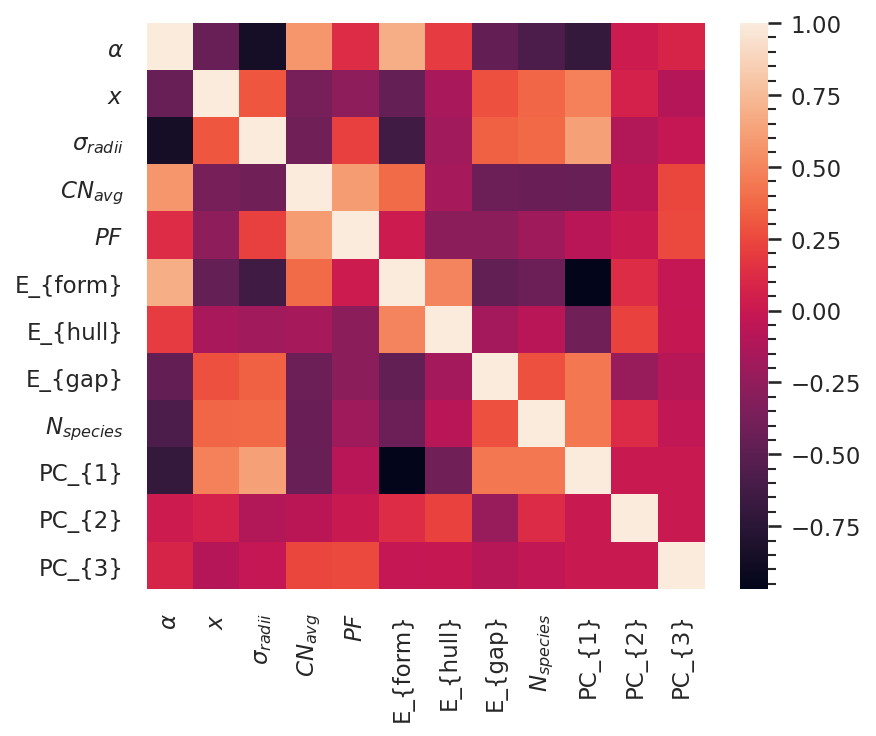

In [73]:
dict_corr={r'$\alpha$':alpha,r'$x$':x, r'$\sigma_{radii}$':std_ratio,
    r'$CN_{avg}$':cn, r'$PF$':packing,
 r'E_{form}':e_form.ravel(),r'E_{hull}':e_hull.ravel(),r'E_{gap}':gap_e.ravel(),
      r'$N_{species}$': n_species,r'PC_{1}': T[:,0],r'PC_{2}': T[:,1],r'PC_{3}': T[:,2]}
df_corr= pd.DataFrame(dict_corr)
sns.heatmap(df_corr.corr())
plt.show()


In [28]:
data = write_input(
    path='../chem/MP'+str(n_frames)+'_beta=0.1.json.gz',
    meta={"name": 'MP'+str(n_frames)+'pcovr'},
    frames=my_frames,
    properties={
        **{f"PCA_{i+1}": 
            {"target": "structure", 
            "values": T[:, i]} for i in range(n_PC)},
        "formation energies": {
            "target": "structure",
            "values": e_form,
        },
        "magic": {
            "target": "structure",
            "values": magic,
        }, 
        "natoms": {
            "target": "structure",
            "values": natoms,
        }, 
         "packing": {
            "target": "structure",
            "values": packing, 
         },
        "alpha": {
            "target": "structure",
            "values": alpha, 
         },
        "x": {
            "target": "structure",
            "values": x, 
         },
        "std_rad": {
            "target": "structure",
            "values": std_ratio, 
         },
        "FCC": {
            "target": "structure",
            "values": fcc, 
         },
    })

In [29]:
soaps=[X_raw[:,i] for i in range(len(X_raw[0]))]
df_raw=pd.DataFrame(soaps)


In [30]:
dict={r'$\alpha$':alpha,r'$x$':x, r'$\sigma_{radii}$':std_ratio,
    r'$CN_{avg}$':cn, r'$N_{atoms,cell}$': natoms.ravel(), r'$PF$':packing,
'magic':magic.ravel(), r'E_{form}':e_form.ravel(), r'$N_{species}$': n_species, 'FCC':fcc}
df= pd.DataFrame(dict)

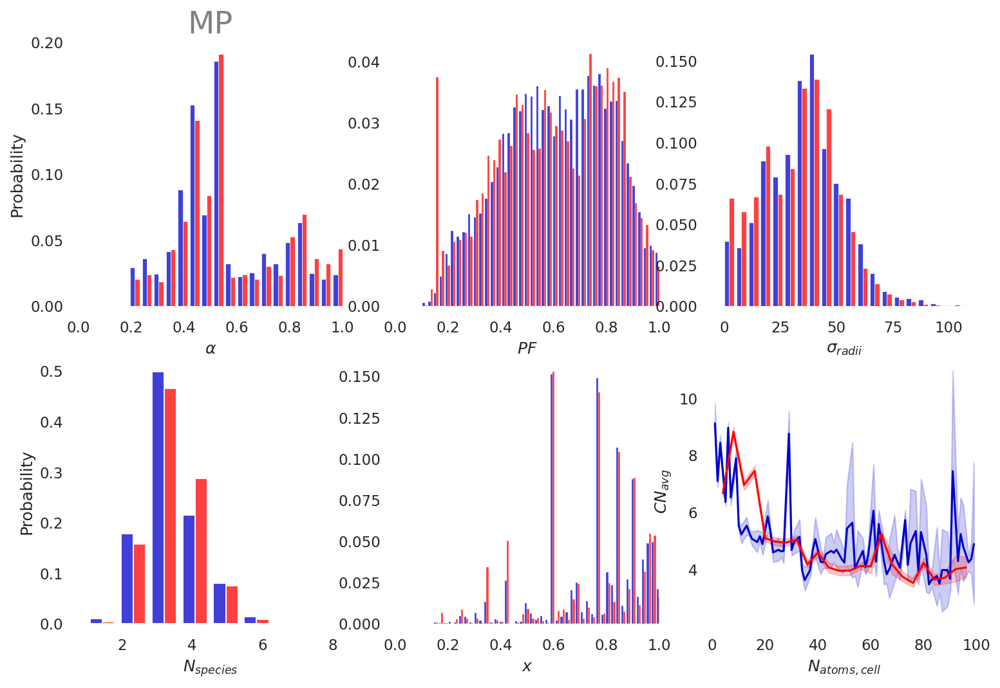

In [140]:
fig, axes = plt.subplots(2,3, figsize=(12,8))

sns.histplot(ax=axes[0][0], data=df, x=r'$\alpha$', hue='magic',stat='probability', legend=False,
               common_norm=False,  multiple='dodge', shrink=.8, bins=20)
axes[0][0].set_xlim(0,1)
axes[0][0].set_title('MP', fontsize=23, color='grey')
sns.histplot(ax=axes[0][1], data=df, x=r'$PF$', hue='magic',stat='probability', legend=False,
               common_norm=False,  multiple='dodge', shrink=.8)

axes[0][1].set_ylabel(None)

axes[0][1].set_xlim(0,1)
sns.histplot(ax=axes[0][2], data=df, x=r'$\sigma_{radii}$', hue='magic',stat='probability', legend=False,
               common_norm=False,  multiple='dodge', shrink=.8, bins=20)
axes[0][2].set_ylabel(None)
sns.histplot(ax=axes[1][0], data=df, x=r'$N_{species}$', hue='magic',stat='probability', legend=False,
               common_norm=False,  multiple='dodge', shrink=.8, bins=int(max(n_species)))
sns.histplot(ax=axes[1][1], data=df, x=r'$x$', hue='magic',stat='probability', legend=False,
               common_norm=False,  multiple='dodge', shrink=.8)
axes[1][1].set_ylabel(None)
axes[1][1].set_xlim(0,1)
sns.lineplot(ax=axes[1][2], data=df, x=r'$N_{atoms,cell}$', y=r'$CN_{avg}$', hue='magic', legend=False)

axes[1][2].set_xlim(0,100)

sns.despine(left=True, bottom=True)

(array([[ -6.24395038e-03,   3.38236225e-03,   3.96579433e-01,
          -6.00059534e-02,   9.15258744e-01,  -1.57500217e-03,
           2.80805708e-03,  -3.15566358e-02,   1.91276990e-02,
          -1.72830894e-03],
        [ -8.70550356e-03,   1.47706430e-03,   9.14974200e-01,
          -3.80544664e-02,  -4.00247216e-01,   4.56383190e-03,
          -5.61758530e-03,  -3.10896905e-02,   8.88382433e-03,
           6.26740111e-04],
        [  1.63453271e-02,  -1.47309236e-02,   6.12800026e-02,
           9.91375167e-01,   4.15947967e-02,   5.86282753e-02,
           2.50323423e-03,   3.45600928e-02,  -8.05606294e-02,
           8.81965213e-03]]),
 array([ 497.17216222,  259.96903744,    7.04350474]),
 array([ 0.64915313,  0.33943919,  0.00919664]))

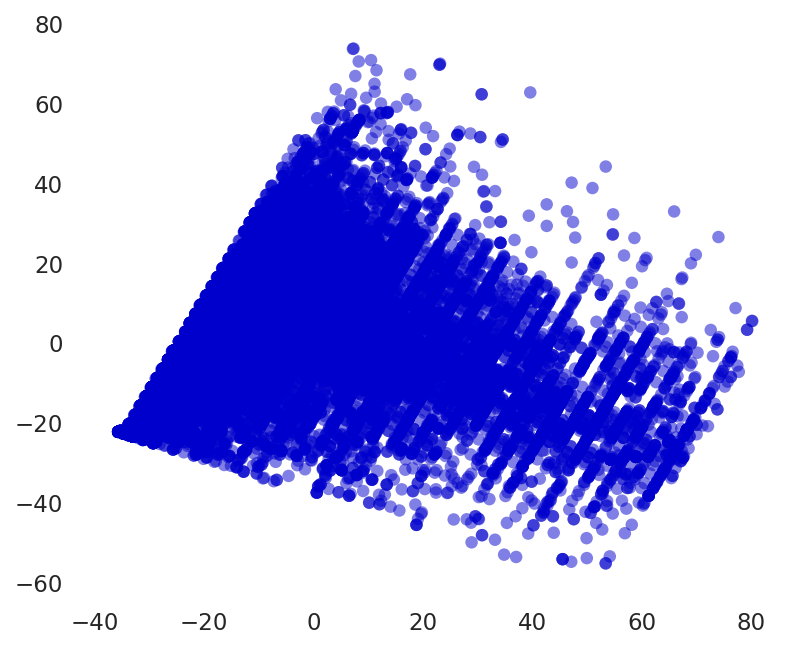

In [39]:
pca = PCA(n_components=n_PC)
proj=pca.fit_transform(df)
plt.scatter(proj[:, 0], proj[:, 1], edgecolor='none', alpha=0.5)

"""components_:ndarray of shape (n_components, n_features):Principal axes in feature space, 
        representing the directions of maximum variance in the data. The components are 
        sorted by explained_variance_
explained_variance_: ndarray of shape (n_components,):The amount of variance explained
        by each of the selected components. The variance estimation uses n_samples - 1 
        degrees of freedom.Equal to n_components largest eigenvalues of the covariance 
        matrix of X.
explained_variance_ratio_: ndarray of shape (n_components,): Percentage of variance 
        explained by each of the selected components.If n_components is not set 
        then all components are stored and the sum of the ratios is equal to 1.0"""
sns.despine(left=True, bottom=True)
pca.components_ , pca.explained_variance_ , pca.explained_variance_ratio_

In [40]:
(pca.components_[0]), (pca.components_[1]), (pca.components_[2])

(array([-0.00624395,  0.00338236,  0.39657943, -0.06000595,  0.91525874,
        -0.001575  ,  0.00280806, -0.03155664,  0.0191277 , -0.00172831]),
 array([ -8.70550356e-03,   1.47706430e-03,   9.14974200e-01,
         -3.80544664e-02,  -4.00247216e-01,   4.56383190e-03,
         -5.61758530e-03,  -3.10896905e-02,   8.88382433e-03,
          6.26740111e-04]),
 array([ 0.01634533, -0.01473092,  0.06128   ,  0.99137517,  0.0415948 ,
         0.05862828,  0.00250323,  0.03456009, -0.08056063,  0.00881965]))

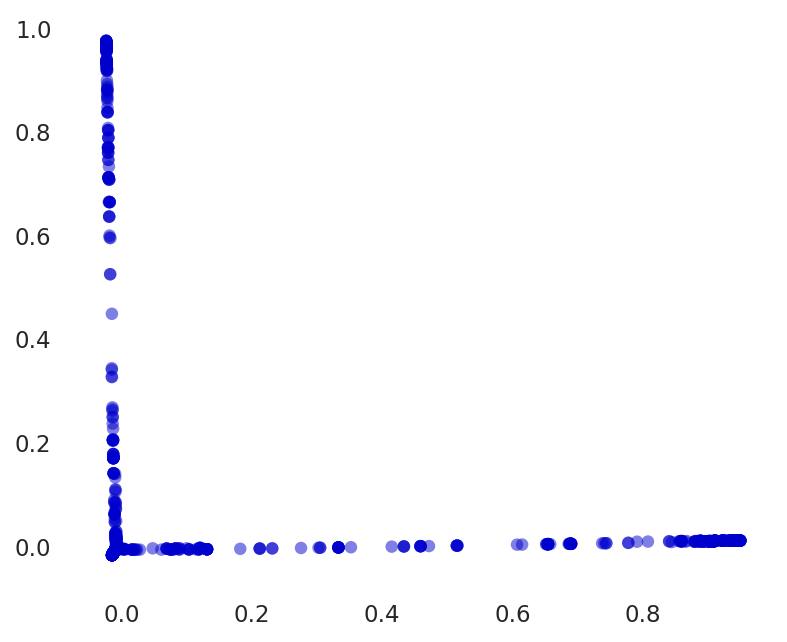

In [38]:
kpca = KernelPCA(n_components=n_PC, kernel='rbf', gamma=1, fit_inverse_transform=True)
kproj=kpca.fit_transform(df)
plt.scatter(kproj[:, 0], kproj[:, 1], edgecolor='none', alpha=0.5)
sns.despine(left=True, bottom=True)

In [41]:
kpcovr = KPCovR(
    mixing=0.5,
    alpha=ridgecv.alpha_,
    kernel="rbf",
    gamma=0.1,
    n_components=n_PC)
kpcovr.fit(X, Y)
Tk = kpcovr.transform(X)
ypk = y_scaler.inverse_transform(kpcovr.predict(X))

fig, (ax1, ax2)= plt.subplots(1,2, figsize=(10,5))

ax1.scatter(Tk[:, 0], Tk[:, 1], s=50, alpha=0.3, c=magic, cmap = my_c)
ax1.set_xlabel(r"$PC_1$")
ax1.set_ylabel(r"$PC_2$")

ax2.scatter(Y, ypk, s=50, alpha=0.5, c=np.abs(Y - yp), cmap='bone_r', edgecolor='k')
ax2.plot(ax2.get_xlim(), ax2.get_xlim(), 'r--')
ax2.set_xlabel(r"y")
ax2.set_ylabel(r"predicted y")
sns.despine(left=True, bottom=True)

KeyboardInterrupt: 